<a href="https://colab.research.google.com/github/lungerjo/lungerjo/blob/main/ORjax.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import jax
import jax.numpy as jnp

import torch
from torchvision.datasets import MNIST

import matplotlib.pyplot as plt

from typing import NamedTuple

from functools import partial
from collections.abc import Callable

from tqdm import tqdm

In [2]:
from jax.config import config
config.update("jax_debug_nans", True)

In [3]:
def numpy_collate(batch: torch.Tensor) -> np.ndarray:
    """Collate function for PyTorch's dataloader. Also cast to np array."""
    if isinstance(batch[0], np.ndarray):
        return np.stack(batch)
    elif isinstance(batch[0], (tuple,list)):
        transposed = zip(*batch)
        return [numpy_collate(samples) for samples in transposed]
    else:
        return np.array(batch)

class NumpyLoader(torch.utils.data.DataLoader):
    """Simple dataLoader that yields np arrays instead of tensors. We want to use PyTorch's dataloader for convenience,
    but yield np arrays for compatibility with JAX."""
    def __init__(self, dataset, batch_size=1,
                 shuffle=False, sampler=None,
                 batch_sampler=None, num_workers=0,
                 pin_memory=False, drop_last=False,
                 timeout=0, worker_init_fn=None):
        super(self.__class__, self).__init__(dataset,
              batch_size=batch_size,
              shuffle=shuffle,
              sampler=sampler,
              batch_sampler=batch_sampler,
              num_workers=num_workers,
              collate_fn=numpy_collate,
              pin_memory=pin_memory,
              drop_last=drop_last,
              timeout=timeout,
              worker_init_fn=worker_init_fn)

class FlattenScaleAndCast(object):
    """Flatten a PIL image to 1D array, and scale pixel values to [0, 1]. Also cast to jnp.float32."""
    def __call__(self, pic):
        #return np.ravel(2 * (np.array(pic, dtype=jnp.float32)/255. - 1))
        return np.ravel(np.array(pic, dtype=jnp.float32)/255.)

class OneHotAndCast(object):
    """One-hot encode a label. Also cast to jnp.float32."""
    def __init__(self, n_classes):
        self.n_classes = n_classes
    def __call__(self, label):
        return jax.nn.one_hot(np.array(label), self.n_classes).astype(jnp.float32)

In [4]:
def predict(params: list[tuple[jnp.ndarray, jnp.ndarray]],
            membrane_potentials: list[jnp.ndarray],
            x: jnp.ndarray) -> jnp.ndarray:
    """Predict the label for a single sample. Returns an array of log probabilities."""
    *hidden_layers, final_layer = zip(params, membrane_potentials)

    activations = x
    for (w, b), potentials in hidden_layers:

        sim = jnp.sum(w @ w.T, axis=1) ** 2

        activations = jax.nn.sigmoid(w @ activations + b - sim) - potentials

        # Only keep top k activations, zero out the rest
        k = int(w.shape[0] * sparsity)
        _, top_k_indices = jax.lax.top_k(activations, k)
        mask = jnp.zeros_like(activations)
        mask = mask.at[top_k_indices].set(1)
        activations *= mask

    (final_w, final_b), _ = final_layer
    logits = final_w @ activations + final_b

    # Normalize to get log-probabilities. We return log(p_i) instead of p_i to avoid numerical underflow,
    # and because Categorical Cross Entropy loss uses log-probabilities.
    return logits - jax.scipy.special.logsumexp(logits)

In [5]:
def predict_and_return_first_layer_activations(params: list[tuple[jnp.ndarray, jnp.ndarray]],
                                               membrane_potentials: list[jnp.ndarray],
                                               x: jnp.ndarray) -> jnp.ndarray:
    """Predict the label for a single sample. Returns an array of log probabilities."""
    *hidden_layers, final_layer = zip(params, membrane_potentials)

    activations = x
    all_activations = []
    for (w, b), potentials in hidden_layers:
        sim = jnp.sum(w @ w.T, axis=1) ** 2

        activations = jax.nn.sigmoid(w @ activations + b - sim) - potentials

        # Only keep top k activations, zero out the rest
        k = int(w.shape[0] * sparsity)
        _, top_k_indices = jax.lax.top_k(activations, k)
        mask = jnp.zeros_like(activations)
        mask = mask.at[top_k_indices].set(1)
        activations *= mask
        all_activations.append(activations)

    (final_w, final_b), _ = final_layer
    logits = final_w @ activations # + final_b

    # Normalize to get log-probabilities. We return log(p_i) instead of p_i to avoid numerical underflow,
    # and because Categorical Cross Entropy loss uses log-probabilities.
    return logits - jax.scipy.special.logsumexp(logits), all_activations[0]

In [6]:
def forward_and_return_first_layer_activations(params: list[tuple[jnp.ndarray, jnp.ndarray]],
                                               membrane_potentials: list[jnp.ndarray],
                                               x: jnp.ndarray) -> jnp.ndarray:
    """Forward pass and return activations of first layer. WIP"""
    layers = zip(params, membrane_potentials)

    activations = x
    all_activations = []
    for (w, b), potentials in layers:
        sim = jnp.sum(w @ w.T, axis=1) ** 2
        activations = jax.nn.sigmoid(w @ activations + b - sim) - potentials

        # Only keep top k activations, zero out the rest
        k = int(w.shape[0] * sparsity)
        _, top_k_indices = jax.lax.top_k(activations, k)
        mask = jnp.zeros_like(activations)
        mask = mask.at[top_k_indices].set(1)
        activations *= mask
        all_activations.append(activations)

    return all_activations[0]

In [7]:
def loss(params: list[tuple[jnp.ndarray, jnp.ndarray]],
         membrane_potentials: list[jnp.array],
         x: jnp.ndarray, target: jnp.ndarray) -> jnp.ndarray:
    """Compute the loss on a single sample for error-driven learning."""
    pred = predict(params, membrane_potentials, x)

    # Categorical cross-entropy, L = -sum(t_i * log(p_i))
    return -jnp.mean(pred * target)

In [8]:
def accuracy(params: list[tuple[jnp.ndarray, jnp.ndarray]],
             membrane_potentials: list[jnp.array],
             batch: tuple[jnp.ndarray, jnp.ndarray]) -> jnp.ndarray:
    """Compute the accuracy of the network on a test batch."""
    xs, targets = batch

    preds = jax.vmap(predict, in_axes=(None, None, 0))(params, membrane_potentials, xs)
    return jnp.mean(jnp.argmax(preds, axis=1) == jnp.argmax(targets, axis=1))

In [9]:
def init_layer_kaiming(m: int, n: int,
                      key: jnp.ndarray) -> tuple[jnp.ndarray, jnp.ndarray]:
    """Initialize layer with randomly sampled parameters from the normal distribution with std sqrt(2/n)."""
    # Probably don't need this initialization if we're using sigmoid instead of relu?
    w_key, b_key = jax.random.split(key)

    return jnp.sqrt(2 / n) * jax.random.normal(w_key, (n, m)), jnp.zeros(n)

def init_layer_uniform(m: int, n: int,
                       key: jnp.ndarray) -> tuple[jnp.ndarray, jnp.ndarray]:
    """Initialize layer with randomly sampled parameters from the uniform distribution U(-1/m, 1/m)."""
    w_key, b_key = jax.random.split(key)
    return 1e-4 * jax.random.uniform(w_key, (n, m), minval=-1.0, maxval=1.0), jnp.zeros(n)

def init_network_params(layer_sizes: list[int],
                        key: jnp.ndarray,
                        init_layer_fn: Callable[[int, int, jnp.ndarray, float, bool], tuple[jnp.ndarray, jnp.ndarray]]
                        ) -> list[tuple[jnp.ndarray, jnp.ndarray]]:
    """Initialize each layer of the network using init_layer_fn()."""
    keys = jax.random.split(key, len(layer_sizes))
    return [init_layer_fn(m, n, k) for m, n, k in zip(layer_sizes[:-1], layer_sizes[1:], keys)]

In [10]:
def _BCM_update(params: list[tuple[jnp.ndarray, jnp.ndarray]],
                floating_thresholds: list[jnp.ndarray],
                membrane_potentials: list[jnp.ndarray],
                x: jnp.ndarray,
                sparsity: float = 0.1) -> tuple[list[tuple[jnp.ndarray, jnp.ndarray]], list[jnp.ndarray]]:
    """Helper function that computes the BCM update for a single sample.
    Returns the weight updates and the post-activations of every hidden layer."""
    hidden_layers = zip(params, floating_thresholds, membrane_potentials)

    dparams = []
    activations = []
    pre_activations = x
    for (w, b), thetas, potentials in hidden_layers:

        sim = jnp.sum(w @ w.T, axis=1) ** 2

        post_activations = jax.nn.sigmoid(w @ pre_activations + b - sim) - potentials

        # Only keep top k activations, zero out the rest
        k = int(w.shape[0] * sparsity)
        # _, top_k_indices = jax.lax.top_k(post_activations, k)
        # mask = jnp.zeros_like(post_activations)
        # mask = mask.at[top_k_indices].set(1)
        # post_activations *= mask

        mask = jnp.zeros_like(post_activations)
        _, top_k_indices = jax.lax.top_k(post_activations, k)
        # _, top_2k_indices = jax.lax.top_k(post_activations, 2 * k)
        # _, top_3k_indices = jax.lax.top_k(post_activations, 3 * k)
        # mask = mask.at[top_3k_indices].set(-1e-1)
        # mask = mask.at[top_2k_indices].set(0)
        mask = mask.at[top_k_indices].set(1)
        post_activations *= mask

        # Vectorized equivalent to dw = pre_activation * post_activation * (post_activation - theta)
        dw = ((post_activations[:, None]) * (post_activations[:, None] - thetas[:, None])) \
             @ pre_activations[None, :]

        # The division by theta is a Law and Cooper 1994 trick to speed up learning and decrease oscillations at high learning rates
        # dw = ((post_activations[:, None] / thetas[:, None]) * (post_activations[:, None] - thetas[:, None])) \
        #      @ pre_activations[None, :]

        dparams.append((dw, jnp.zeros_like(b)))
        activations.append(post_activations)

        pre_activations = post_activations

    # # No hebbian learning for final layer
    # (final_w, final_b), final_thetas, final_potentials = final_layer
    # dparams.append((jnp.zeros_like(final_w), jnp.zeros_like(final_b)))
    # activations.append(jnp.zeros_like(final_thetas))

    return dparams, activations


@partial(jax.jit, static_argnames=['sparsity', 'debug'])
def BCM_update(params: list[tuple[jnp.ndarray, jnp.ndarray]],
               floating_thresholds: list[jnp.ndarray],
               membrane_potentials: list[jnp.ndarray],
               batch: tuple[jnp.ndarray, jnp.ndarray],
               sparsity: float = 0.1,
               learning_rate: float = 1e-4,
               weight_decay: float = 1e-4,
               debug: bool = False
               ) -> tuple[list[tuple[jnp.ndarray, jnp.ndarray]], list[jnp.ndarray], list[jnp.ndarray]]:
    """Apply one step of the BCM learning rule on a batch of samples for Hebbian learning."""
    xs, _ = batch

    # Get the per-sample updates, then reduce them over the batch dimension:
    batched_dparams, batched_hidden_activations = \
        jax.vmap(_BCM_update, in_axes=[None, None, None, 0, None])(params, floating_thresholds, membrane_potentials, xs, sparsity)

    dparams = jax.tree_map(lambda p: jnp.mean(p, axis=0), batched_dparams)

    hidden_activations = jax.tree_map(lambda x: jnp.mean(x, axis=0), batched_hidden_activations)

    # Uniform weight decay
    #updated_params = jax.tree_map(lambda p, dparam: p * (1 - weight_decay) + learning_rate * dparam, params, dparams)

    # Apply weight decay to each neuron proportional to l2 norm of incoming weights for hebbian layers (i.e. params[:-1])
    #updated_params = jax.tree_map(lambda p, dparam: p + learning_rate * dparam, params, dparams)
    #updated_params = [*[(w - weight_decay * jnp.mean((w ** 2), axis=1)[:, None], b) for (w, b) in updated_params[:-1]], updated_params[-1]]

    # Apply weight decay to each neuron proportional to incoming weights for hebbian layers (i.e. params[:-1]); not l1 norm, negatives reduce decay
    _updated_params = jax.tree_map(lambda p, dparam: p + learning_rate * dparam, params, dparams)
    updated_params = [(jnp.maximum(w - weight_decay * jnp.mean(w, axis=1)[:, None], -1e-4), b) for (w, b) in _updated_params]
    #updated_params = [(w - weight_decay * w, b) for (w, b) in _updated_params]

    # TODO: Make this a hyperparameter?
    updated_thresholds = jax.tree_map(lambda t, a: (0.99 * t) + 0.01 * jnp.square(a),
                                      floating_thresholds, hidden_activations)
    updated_potentials = jax.tree_map(lambda t, a: (0.99 * t) + 0.01 * a,
                                      membrane_potentials, hidden_activations)

    if debug:
        params_mean = jax.tree_map(lambda p: jnp.mean(p), params)
        params_median = jax.tree_map(lambda p: jnp.median(p), params)
        params_min = [jnp.min(w) for (w, b) in params]
        params_max = [jnp.max(w) for (w, b) in params]
        dparams_mean = jax.tree_map(lambda d: jnp.mean(d) * learning_rate, dparams)
        dparams_median = jax.tree_map(lambda d: jnp.median(d) * learning_rate, dparams)
        dparams_min = [jnp.min(dw) * learning_rate for (dw, db) in dparams]
        dparams_max = [jnp.max(dw) * learning_rate for (dw, db) in dparams]
        decay = jax.tree_map(lambda u, _u: u - _u, updated_params, _updated_params)
        decay_mean = jax.tree_map(lambda d: jnp.mean(d), decay)
        decay_median = jax.tree_map(lambda d: jnp.median(d), decay)
        decay_min = [jnp.min(dw) for (dw, db) in decay]
        decay_max = [jnp.max(dw) for (dw, db) in decay]

        debug_info = {}
        debug_info['params_mean'] = params_mean
        debug_info['params_median'] = params_median
        debug_info['params_min'] = params_min
        debug_info['params_max'] = params_max
        debug_info['dparams_mean'] = dparams_mean
        debug_info['dparams_median'] = dparams_median
        debug_info['dparams_min'] = dparams_min
        debug_info['dparams_max'] = dparams_max
        debug_info['decay_mean'] = decay_mean
        debug_info['decay_median'] = decay_median
        debug_info['decay_min'] = decay_min
        debug_info['decay_max'] = decay_max

        return updated_params, updated_thresholds, updated_potentials, debug_info

    return updated_params, updated_thresholds, updated_potentials

In [15]:
@partial(jax.jit, static_argnames=['freeze_hiddens'])
def backprop_update(params: list[tuple[jnp.ndarray, jnp.ndarray]],
                    membrane_potentials: list[jnp.ndarray],
                    batch: tuple[jnp.ndarray, jnp.ndarray],
                    learning_rate: float = 1e-4,
                    weight_decay: float = 1e-4,
                    freeze_hiddens: bool = False):
    """Apply one step of backprop gradient descent on batch for error-driven learning."""
    xs, targets = batch
    batched_grads = jax.vmap(jax.grad(loss), in_axes=[None, None, 0, 0])(params, membrane_potentials, xs, targets)

    grads = jax.tree_map(lambda sample_grads: jnp.mean(sample_grads, axis=0), batched_grads)

    # Freeze previous layers
    if freeze_hiddens:
        updated_final_layer = jax.tree_map(lambda p, g: p - learning_rate * g, params[-1], grads[-1])
        updated_params = [*params[:-1], updated_final_layer]

        avg_dparams = jax.tree_map(lambda u, p: jnp.mean(u - p), updated_params, params)
        return updated_params, avg_dparams

    updated_params = jax.tree_map(lambda p, g: p - learning_rate * g, params, grads)
    avg_dparams = jax.tree_map(lambda u, p: jnp.mean(u - p), updated_params, params)

    return updated_params, avg_dparams

In [16]:
def visualize_layer_weights(params: list[tuple[jnp.ndarray, jnp.ndarray]],
                            layer: int,
                            n_rows: int = 8,
                            n_cols: int = 8,
                            save_path: str = None):
    """Visualize the weights of a layer as a grid of images."""
    w, b = params[layer]
    w = w.reshape((w.shape[0], 28, 28))

    fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(28, 28))
    axs = axs.flatten()

    for i, ax in enumerate(axs):
        ax.axis('off')
        ax.imshow(w[i], cmap='gray')

    if save_path is not None:
        plt.savefig(save_path)

    plt.show()

In [ ]:
def visualize_activations(activations: jnp.ndarray,
                          save_path: str = None):
    """Visualize the activations of a layer."""

    activations = activations.reshape((64, 64))
    plt.imshow(activations, cmap='gray')

    plt.show()

In [ ]:
def visualize_diversity(params: list[tuple[jnp.ndarray, jnp.ndarray]],
                        membrane_potentials: list[jnp.ndarray],
                        layer: int,
                        test_set: tuple[jnp.ndarray, jnp.ndarray]) -> None:
    """Visualize the percentage of different neurons activated by the test set."""
    xs, targets = test_set
    # TODO make layer a parameter
    activations = jax.vmap(forward_and_return_first_layer_activations, in_axes=(None, None, 0))(params, membrane_potentials, xs)

    activation_counts = jnp.sum(activations > 0, axis=0)

    print("The most active neuron was activated {} out of {} runs.".format(jnp.max(activation_counts), len(test_set[0])))
    print("The least active neuron was activated {} out of {} runs.".format(jnp.min(activation_counts), len(test_set[0])))
    print("The average activation count is: ", jnp.mean(activation_counts))
    print("The median activation count is: ", jnp.median(activation_counts))
    print("Standard deviation of neuron activations: ", jnp.std(activation_counts))

    plt.imshow(activation_counts.reshape((32, 32)), cmap='gray')
    plt.show()

    # activations = jnp.mean(activations, axis=0)
    # plt.imshow(activations.reshape((64, 64)), cmap='gray')
    # plt.show()

In [ ]:
def visualize_layer_weights_with_activation_mask(params: list[tuple[jnp.ndarray, jnp.ndarray]],
                            layer: int,
                            activation_mask: jnp.ndarray,
                            save_path: str = None):
    """Visualize the weights of a layer as a grid of images, masked by activation_mask."""
    w, b = params[layer]

    w = w.reshape((w.shape[0], 28, 28))
    mask = activation_mask > 0

    w *= mask[:, None, None]

    fig, axs = plt.subplots(nrows=32, ncols=32, figsize=(28, 28))
    axs = axs.flatten()

    for i, ax in enumerate(axs):
        ax.axis('off')
        ax.imshow(w[i], cmap='gray')

    if save_path is not None:
        plt.savefig(save_path)

    plt.show()

In [ ]:
layer_sizes = [784, 1024, 10]
batch_size = 128
n_targets = 10
error_driven_lr = 1e-3
hebbian_lr = 1e-4
sparsity = 0.05
weight_decay = 2.5e-3

In [ ]:
# Define our dataset, using torch datasets
mnist_dataset = MNIST('/tmp/mnist/', download=True, transform=FlattenScaleAndCast(), target_transform=OneHotAndCast(n_classes=10))
training_generator = NumpyLoader(mnist_dataset, batch_size=batch_size, num_workers=0)

# Get the full train dataset (for checking accuracy while training)
train_images = jnp.array(mnist_dataset.data.numpy().reshape(len(mnist_dataset.data), -1), dtype=jnp.float32) / 255.
train_labels = jax.nn.one_hot(np.array(mnist_dataset.targets), n_targets)

# Get full test dataset
mnist_dataset_test = MNIST('/tmp/mnist/', download=True, train=False)
test_images = jnp.array(mnist_dataset_test.data.numpy().reshape(len(mnist_dataset_test.data), -1), dtype=jnp.float32) / 255.
test_labels = jax.nn.one_hot(np.array(mnist_dataset_test.targets), n_targets)

In [ ]:
# Init network
key = jax.random.PRNGKey(0)
key, subkey = jax.random.split(key)

params = init_network_params(layer_sizes, subkey, init_layer_uniform)

# Init membrane_potentials and floating thresholds proportional to size of weights
membrane_potentials = [jax.nn.sigmoid(jnp.mean(w, axis=1) / 2) for (w, b) in params]
floating_thresholds = jax.tree_map(lambda t: t ** 2, membrane_potentials)

#floating_thresholds = [1e-5 * jnp.ones(n_units) for n_units in layer_sizes[1:]]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:28<00:00, 16.55it/s]


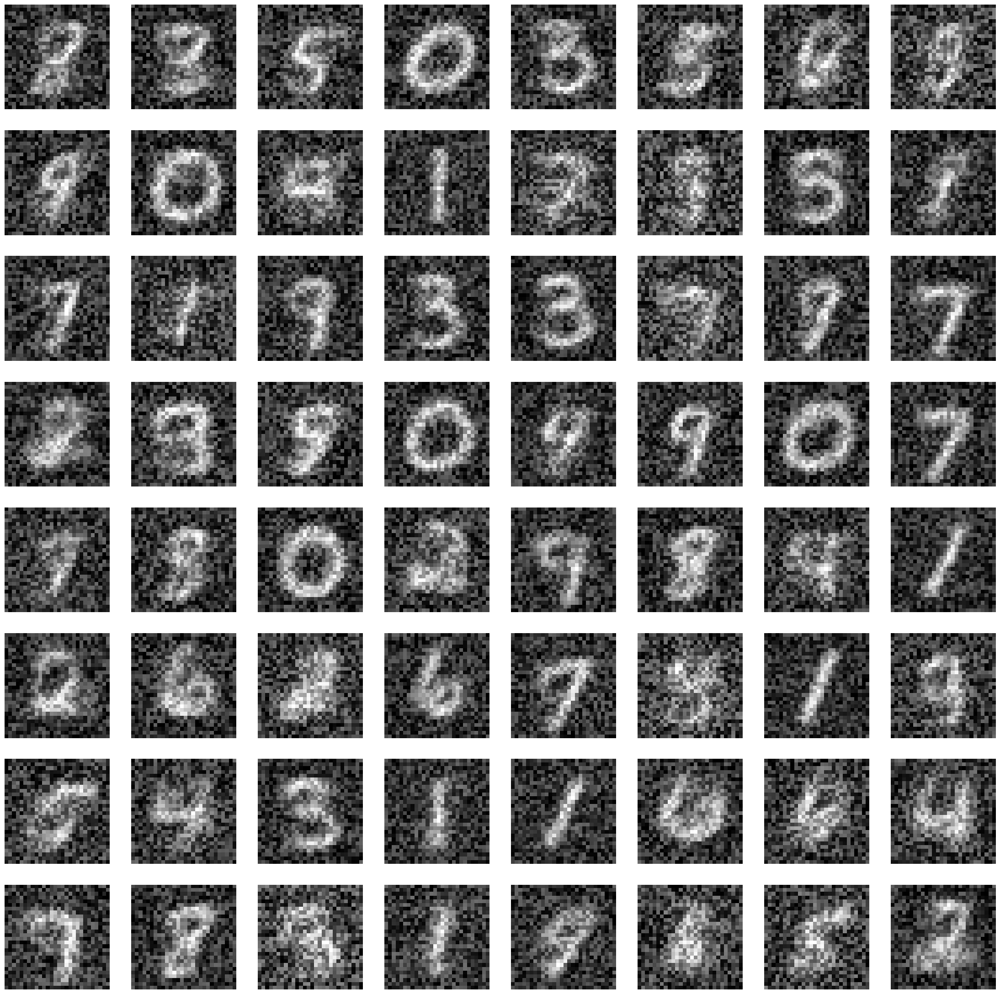

The most active neuron was activated 3315 out of 10000 runs.
The least active neuron was activated 0 out of 10000 runs.
The average activation count is:  498.04688
The median activation count is:  353.0
Standard deviation of neuron activations:  464.77444


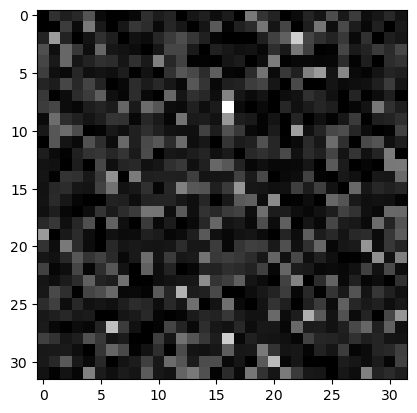

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:28<00:00, 16.67it/s]


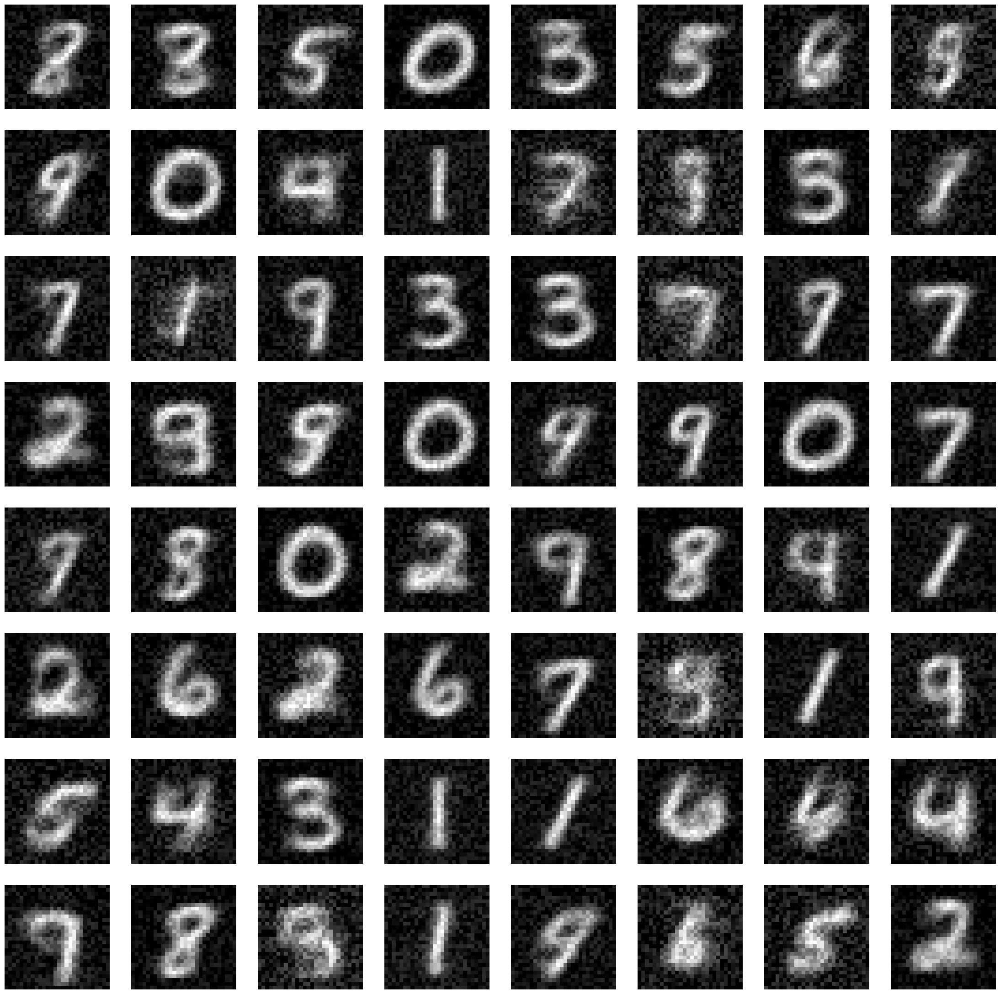

The most active neuron was activated 1682 out of 10000 runs.
The least active neuron was activated 1 out of 10000 runs.
The average activation count is:  498.04688
The median activation count is:  425.5
Standard deviation of neuron activations:  299.57574


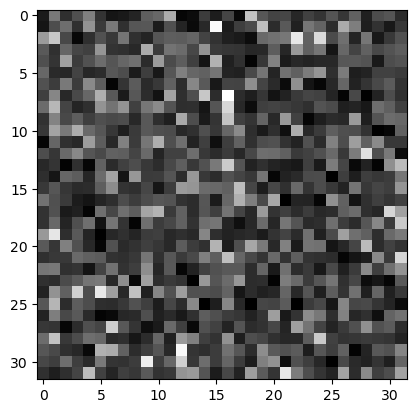

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:28<00:00, 16.52it/s]


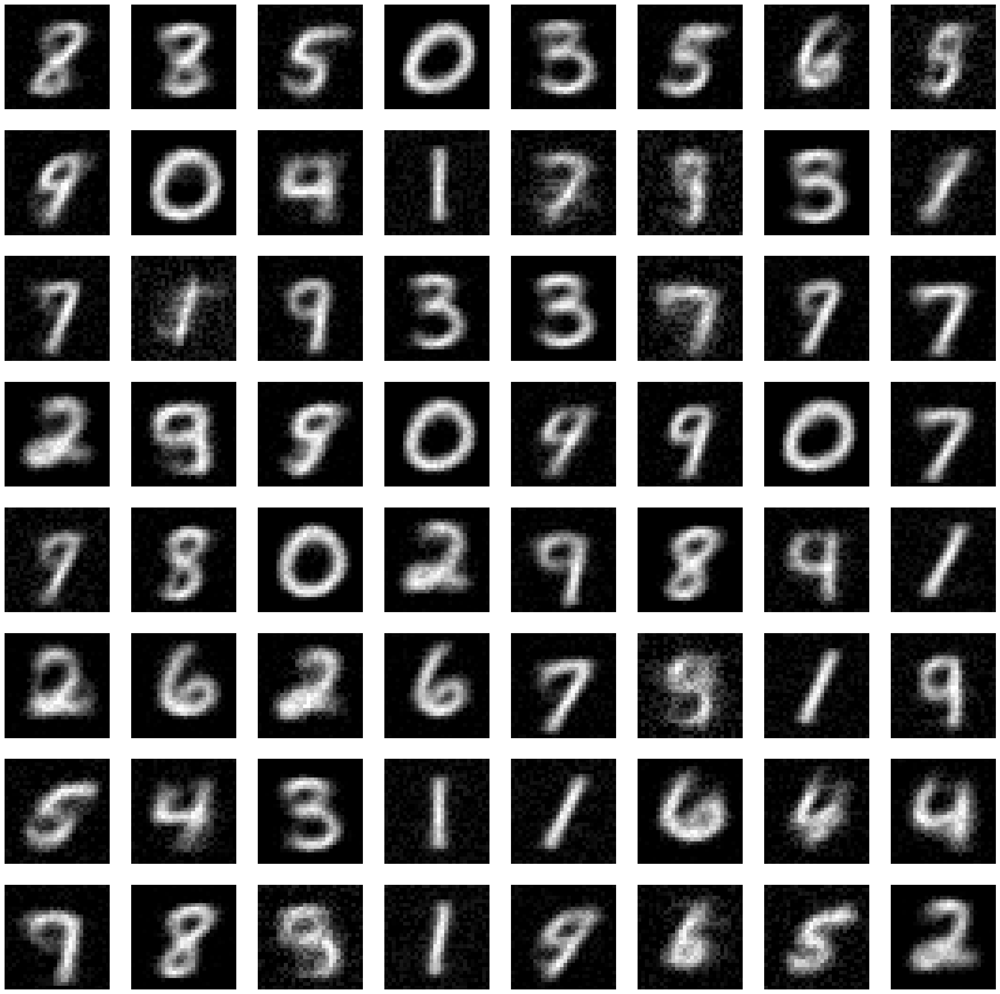

The most active neuron was activated 1510 out of 10000 runs.
The least active neuron was activated 33 out of 10000 runs.
The average activation count is:  498.04688
The median activation count is:  464.0
Standard deviation of neuron activations:  222.10199


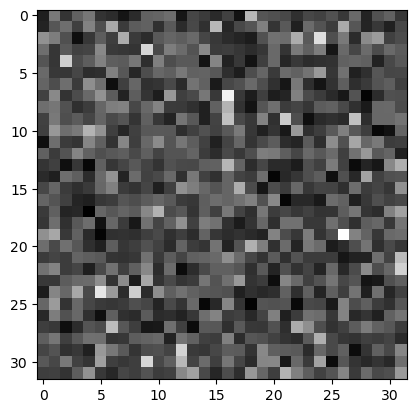

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:26<00:00, 17.67it/s]


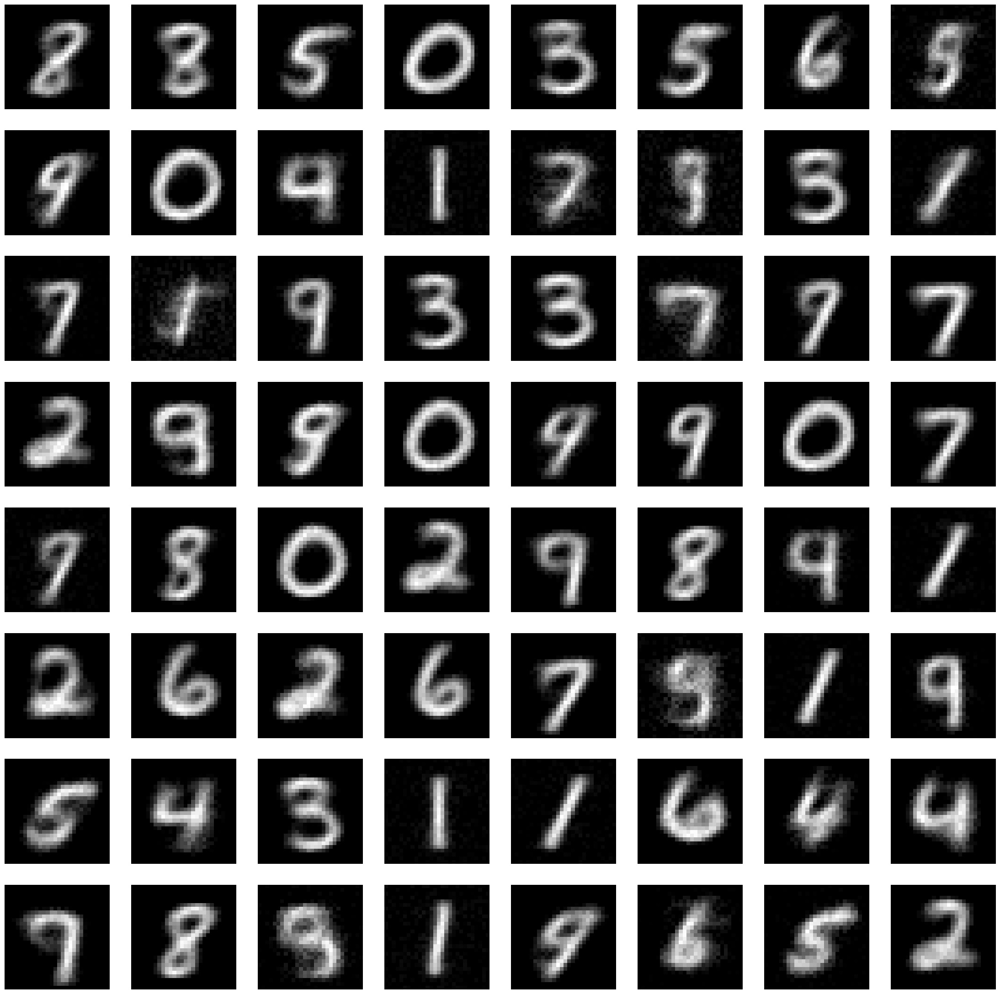

The most active neuron was activated 1223 out of 10000 runs.
The least active neuron was activated 106 out of 10000 runs.
The average activation count is:  498.04688
The median activation count is:  475.0
Standard deviation of neuron activations:  179.88762


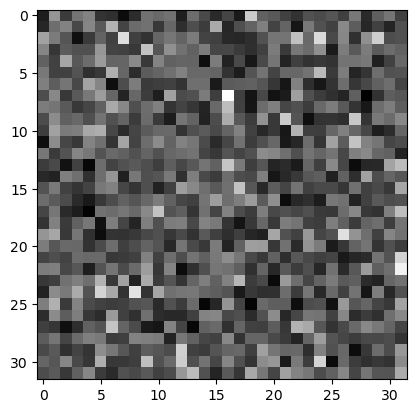

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:27<00:00, 16.92it/s]


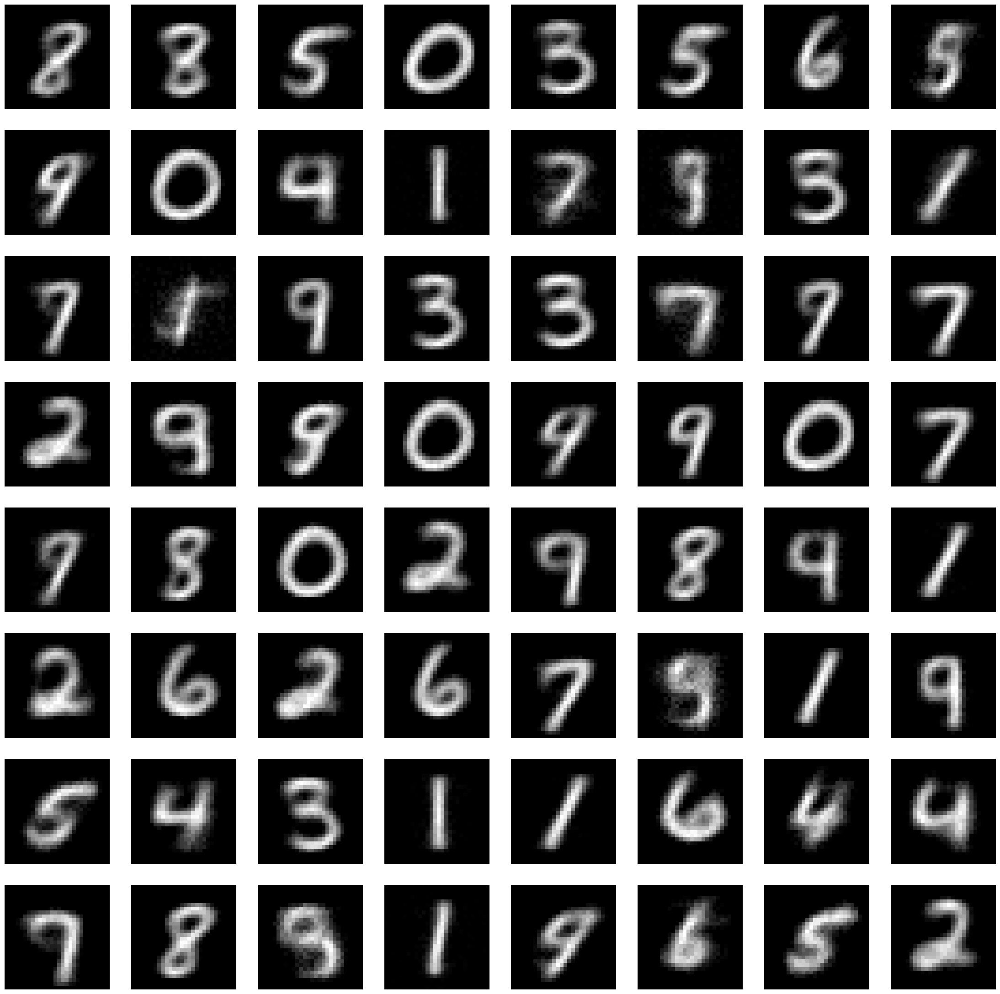

The most active neuron was activated 1045 out of 10000 runs.
The least active neuron was activated 149 out of 10000 runs.
The average activation count is:  498.04688
The median activation count is:  485.5
Standard deviation of neuron activations:  155.2183


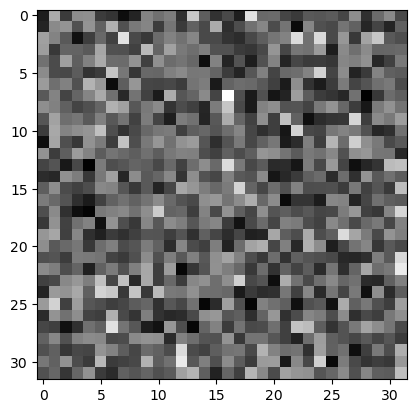

In [ ]:
debug = False

for epoch in range(5):
    for batch in tqdm(training_generator):
        if debug:
            params[:1], floating_thresholds[:1], membrane_potentials[:1], debug_info = BCM_update(params[:1], floating_thresholds[:1], membrane_potentials[:1], batch, sparsity, hebbian_lr, weight_decay, debug=True)
            for k, v in debug_info.items():
                print(k, v)
        else:
            params[:1], floating_thresholds[:1], membrane_potentials[:1] = BCM_update(params[:1], floating_thresholds[:1], membrane_potentials[:1], batch, sparsity, hebbian_lr, weight_decay, debug=False)

    visualize_layer_weights(params[:1], 0)
    visualize_diversity(params[:1], membrane_potentials[:1], 0, (test_images, None))

In [ ]:
w = params[0][0]
sim = jnp.sum(w @ w.T, axis=1)
z = w @ test_images[0]

In [ ]:
print(sim[:10] ** 2)
print(z[:10])

[0.00195378 0.00241778 0.00187959 0.00236653 0.00164868 0.00207244
 0.00125254 0.00116871 0.00202711 0.00160051]
[0.02009059 0.027233   0.02740061 0.02699375 0.01673916 0.02605002
 0.01847257 0.02182492 0.03108234 0.02352783]


In [ ]:
visualize_diversity(params[:1], membrane_potentials[:1], 0, (test_images, None))

In [ ]:
w = params[0][0]
sim = jnp.sum(w @ w.T, axis=1)/w.shape[0]

In [ ]:
jnp.max(sim)

Array(8.292342e-05, dtype=float32)

In [ ]:
# Hebbian learning layer-by-layer
debug = False

for epoch in range(5):
    for batch in tqdm(training_generator):
        if debug:
            params[:1], floating_thresholds[:1], membrane_potentials[:1], debug_info = BCM_update(params[:1], floating_thresholds[:1], membrane_potentials[:1], batch, sparsity, hebbian_lr, weight_decay, debug=True)
            for k, v in debug_info.items():
                print(k, v)
        else:
            params[:1], floating_thresholds[:1], membrane_potentials[:1] = BCM_update(params[:1], floating_thresholds[:1], membrane_potentials[:1], batch, sparsity, hebbian_lr, weight_decay, debug=False)

    visualize_layer_weights(params[:1], 0)
    visualize_diversity(params[:1], membrane_potentials[:1], 0, (test_images, None))

# for epoch in range(2):
#     for batch in tqdm(training_generator):
#         if debug:
#             params[:2], floating_thresholds[:2], membrane_potentials[:2], debug_info = BCM_update(params[:2], floating_thresholds[:2], membrane_potentials[:2], batch, sparsity, hebbian_lr, weight_decay, debug=True)
#             for k, v in debug_info.items():
#                 print(k, v)
#         else:
#             params[:2], floating_thresholds[:2], membrane_potentials[:2] = BCM_update(params[:2], floating_thresholds[:2], membrane_potentials[:2], batch, sparsity, hebbian_lr, weight_decay, debug=False)

#     visualize_layer_weights(params[:2], 0)
#     visualize_diversity(params[:2], membrane_potentials[:2], 0, (test_images, None))

# for epoch in range(5):
#     for i, batch in enumerate(tqdm(training_generator)):
#         if debug:
#             params, floating_thresholds, membrane_potentials, debug_info = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=True)
#             for k, v in debug_info.items():
#                 print(k, v)
#         else:
#             params, floating_thresholds, membrane_potentials = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=False)
#             #if i % 10 == 0:
#             params, error_avg_dparams = backprop_update(params, membrane_potentials, batch, error_driven_lr, weight_decay)

#     visualize_layer_weights(params, 0)
#     visualize_diversity(params, membrane_potentials, 0, (test_images, None))
#     test_acc = accuracy(params, membrane_potentials, (test_images[:1000], test_labels[:1000]))
#     print("Current test accuracy {}".format(test_acc))

In [ ]:
# Hebbian learning
debug = False

#epoch_params = [params]
#epoch_potentials = [membrane_potentials]

# for epoch in range(2):
#     for batch in tqdm(training_generator):
#         if debug:
#             params, floating_thresholds, membrane_potentials, debug_info = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=True)
#             for k, v in debug_info.items():
#                 print(k, v)
#         else:
#             params, floating_thresholds, membrane_potentials = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=False)

#     visualize_layer_weights(params, 0)
#     visualize_diversity(params, membrane_potentials, 0, (test_images, None))

for epoch in range(5):
    for i, batch in enumerate(tqdm(training_generator)):
        if debug:
            params, floating_thresholds, membrane_potentials, debug_info = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=True)
            for k, v in debug_info.items():
                print(k, v)
        else:
            params, floating_thresholds, membrane_potentials = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=False)
            #if i % 10 == 0:
            params, error_avg_dparams = backprop_update(params, membrane_potentials, batch, error_driven_lr, weight_decay)

    visualize_layer_weights(params, 0)
    visualize_diversity(params, membrane_potentials, 0, (test_images, None))
    test_acc = accuracy(params, membrane_potentials, (test_images[:1000], test_labels[:1000]))
    print("Current test accuracy {}".format(test_acc))

In [ ]:
test_acc = accuracy(params, membrane_potentials, (test_images[:1000], test_labels[:1000]))
print("Current test accuracy {}".format(test_acc))

Current test accuracy 0.690000057220459


In [ ]:
debug=True
for epoch in range(3):
    for batch in tqdm(training_generator):
        if debug:
            params, floating_thresholds, membrane_potentials, debug_info = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=True)
            params, error_avg_dparams = backprop_update(params, membrane_potentials, batch, 1e-2, weight_decay)
            for k, v in debug_info.items():
                print(k, v)
        else:
            params, floating_thresholds, membrane_potentials = BCM_update(params, floating_thresholds, membrane_potentials, batch, sparsity, hebbian_lr, weight_decay, debug=False)
            params, error_avg_dparams = backprop_update(params, membrane_potentials, batch, 1e-2, weight_decay)

        test_acc = accuracy(params, membrane_potentials, (test_images[:10000], test_labels[:10000]))
        print("Current test accuracy {}".format(test_acc))

The most active neuron was activated 624 out of 10000 runs.
The least active neuron was activated 7 out of 10000 runs.
The average activation count is:  197.7539
The median activation count is:  186.0
Standard deviation of neuron activations:  87.23623

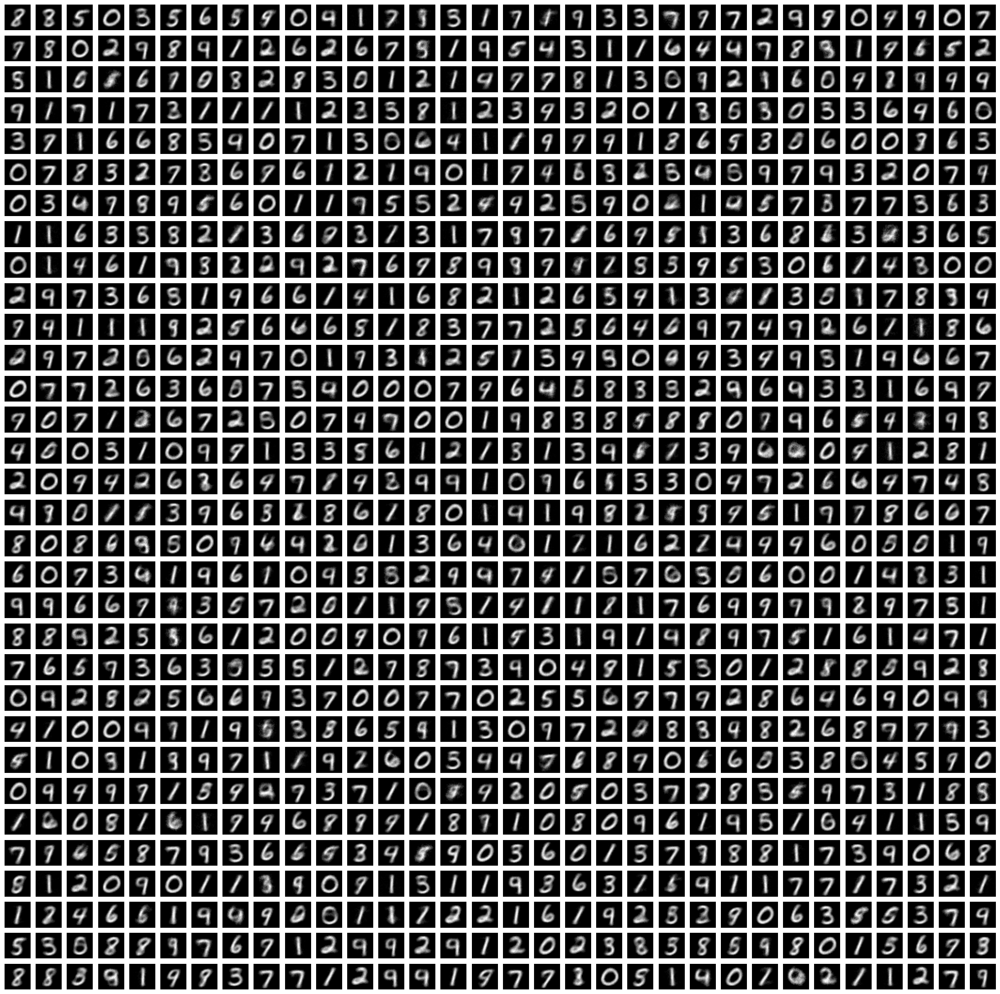

In [ ]:
visualize_layer_weights(params, 0, 32, 32)

The most active neuron was activated 9898 out of 10000 runs.
The least active neuron was activated 0 out of 10000 runs.
The average activation count is:  996.09375
The median activation count is:  0.0
Standard deviation of neuron activations:  2238.5474


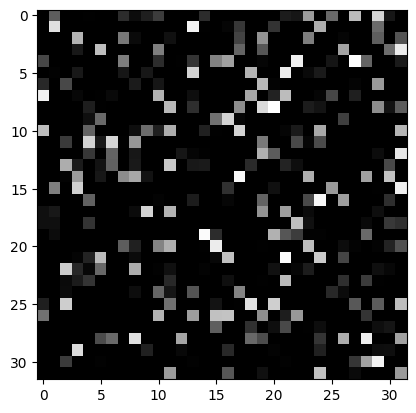

In [ ]:
visualize_diversity(params, membrane_potentials, 0, (test_images, None))

The most active neuron was activated 1711 out of 10000 runs.
The least active neuron was activated 337 out of 10000 runs.
The average activation count is:  996.09375
The median activation count is:  1022.0
Standard deviation of neuron activations:  254.75566


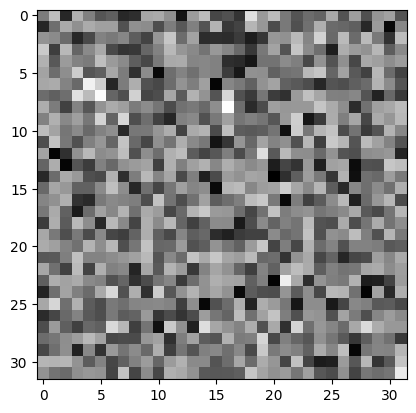

In [ ]:
i = 6
params = epoch_params[i]
membrane_potentials = epoch_potentials[i]
visualize_diversity(params, membrane_potentials, 0, (test_images, None))

In [ ]:
final_layer = init_network_params([1024, 10], jax.random.PRNGKey(2), init_layer_normal)
backprop_params = [*params[:-1], final_layer[0]]

NameError: ignored

In [ ]:
# Visualize
for i, batch in enumerate(training_generator):

    _, first_layer_activations = predict_and_return_first_layer_activations(backprop_params, membrane_potentials, batch[0][7])


    #visualize_activations(first_layer_activations)
    visualize_layer_weights_with_activation_mask(backprop_params, 0, first_layer_activations)
    plt.imshow(batch[0][7].reshape((28, 28)), cmap='gray')
    print(batch[1][7])

KeyboardInterrupt: ignored

In [ ]:
*hidden_layers, final_layer = zip(params, membrane_potentials)

for x in test_images:

    activations = x
    all_activations = []
    for (w, b), potentials in hidden_layers:
        activations = jax.nn.sigmoid(w @ activations) - potentials

        # Only keep top k activations, zero out the rest
        k = int(w.shape[0] * sparsity)
        _, top_k_indices = jax.lax.top_k(activations, k)

        breakpoint()

        mask = jnp.zeros_like(activations)
        mask = mask.at[top_k_indices].set(1)
        activations *= mask
        all_activations.append(activations)

        print(top_k_indices)

    (final_w, final_b), _ = final_layer
    logits = final_w @ activations # + final_b


PYDEV DEBUGGER WARNING:
sys.settrace() should not be used when the debugger is being used.
This may cause the debugger to stop working correctly.
If this is needed, please check: 
http://pydev.blogspot.com/2007/06/why-cant-pydev-debugger-work-with.html
to see how to restore the debug tracing back correctly.
Call Location:
  File "/usr/lib/python3.10/bdb.py", line 336, in set_trace
    sys.settrace(self.trace_dispatch)



> <ipython-input-85-25bafa7b7054>(16)<cell line: 3>()
     14         breakpoint()
     15 
---> 16         mask = jnp.zeros_like(activations)
     17         mask = mask.at[top_k_indices].set(1)
     18         activations *= mask

ipdb> top_k_indices
Array([2076,  470, 4011,  403, 3090, 1354, 3752, 2720, 2721,  410, 2448,
       1573, 2919, 2456,  963, 1524, 2663, 3231, 1923, 1970, 2144, 1170,
        701, 1392, 2658, 3778,  647, 4061,   61, 2557, 1393, 3729, 2637,
       3259, 3115, 2127, 2803, 3037, 3673, 4091], dtype=int32)
ipdb> q



PYDEV DEBUGGER WARNING:
sys.settrace() should not be used when the debugger is being used.
This may cause the debugger to stop working correctly.
If this is needed, please check: 
http://pydev.blogspot.com/2007/06/why-cant-pydev-debugger-work-with.html
to see how to restore the debug tracing back correctly.
Call Location:
  File "/usr/lib/python3.10/bdb.py", line 361, in set_quit
    sys.settrace(None)



In [ ]:
# Fit
final_layer = init_network_params([1024, 10], jax.random.PRNGKey(2), init_layer_kaiming)
backprop_params = [*params[:-1], final_layer[0]]

#backprop_params = params

for i, batch in enumerate(training_generator):

    backprop_params, avg_dparams = backprop_update(backprop_params, membrane_potentials, batch, 100, weight_decay, freeze_hiddens=True)

    if i % 100 == 0:
        print("Avg dparams: ", avg_dparams)
        test_acc = accuracy(backprop_params, membrane_potentials, (test_images[:1000], test_labels[:1000]))
        print("Current test accuracy {}".format(test_acc))

train_acc = accuracy(backprop_params, membrane_potentials, (train_images, train_labels))
test_acc = accuracy(backprop_params, membrane_potentials, (test_images, test_labels))
#print("Epoch {} in {:0.2f} sec".format(epoch, epoch_time))
print("Training set accuracy {}".format(train_acc))
print("Test set accuracy {}".format(test_acc))

Avg dparams:  [(Array(0., dtype=float32), Array(0., dtype=float32)), (Array(5.820766e-11, dtype=float32), Array(8.940697e-09, dtype=float32))]
Current test accuracy 0.5290000438690186
Avg dparams:  [(Array(0., dtype=float32), Array(0., dtype=float32)), (Array(3.783498e-10, dtype=float32), Array(2.9802323e-09, dtype=float32))]
Current test accuracy 0.8230000138282776
Avg dparams:  [(Array(0., dtype=float32), Array(0., dtype=float32)), (Array(2.2191671e-10, dtype=float32), Array(-8.940697e-09, dtype=float32))]
Current test accuracy 0.8600000143051147
Avg dparams:  [(Array(0., dtype=float32), Array(0., dtype=float32)), (Array(-3.0559024e-11, dtype=float32), Array(-4.0978194e-09, dtype=float32))]
Current test accuracy 0.8510000109672546
Avg dparams:  [(Array(0., dtype=float32), Array(0., dtype=float32)), (Array(-4.0163287e-10, dtype=float32), Array(0., dtype=float32))]
Current test accuracy 0.8700000643730164
Training set accuracy 0.879633367061615
Test set accuracy 0.8776999711990356


In [ ]:
    only_error_params = init_network_params([784, 10], jax.random.PRNGKey(3), init_layer_normal)

In [ ]:
# Fit
for i, batch in enumerate(training_generator):
    only_error_params, avg_dparams = backprop_update(only_error_params, [jnp.zeros_like(p) for p in membrane_potentials], batch, 1e-2, weight_decay)

    if i % 100 == 0:
        print("Avg dparams: ", avg_dparams)
        test_acc = accuracy(only_error_params, [jnp.zeros_like(p) for p in membrane_potentials], (test_images[:1000], test_labels[:1000]))
        print("Current test accuracy {}".format(test_acc))

train_acc = accuracy(only_error_params, [jnp.zeros_like(p) for p in membrane_potentials], (train_images, train_labels))
test_acc = accuracy(only_error_params, [jnp.zeros_like(p) for p in membrane_potentials], (test_images, test_labels))
#print("Epoch {} in {:0.2f} sec".format(epoch, epoch_time))
print("Training set accuracy {}".format(train_acc))
print("Test set accuracy {}".format(test_acc))

Avg dparams:  [(Array(-4.0834456e-14, dtype=float32), Array(-8.367351e-12, dtype=float32))]
Current test accuracy 0.10400000214576721
Avg dparams:  [(Array(-1.781867e-13, dtype=float32), Array(-6.548362e-12, dtype=float32))]
Current test accuracy 0.6700000166893005
Avg dparams:  [(Array(3.7864677e-13, dtype=float32), Array(-1.3096724e-11, dtype=float32))]
Current test accuracy 0.7120000123977661
Avg dparams:  [(Array(-9.65178e-14, dtype=float32), Array(1.4551915e-11, dtype=float32))]
Current test accuracy 0.7230000495910645
Avg dparams:  [(Array(-2.3201395e-12, dtype=float32), Array(2.1827873e-11, dtype=float32))]
Current test accuracy 0.7360000610351562
Training set accuracy 0.7484999895095825
Test set accuracy 0.7568999528884888


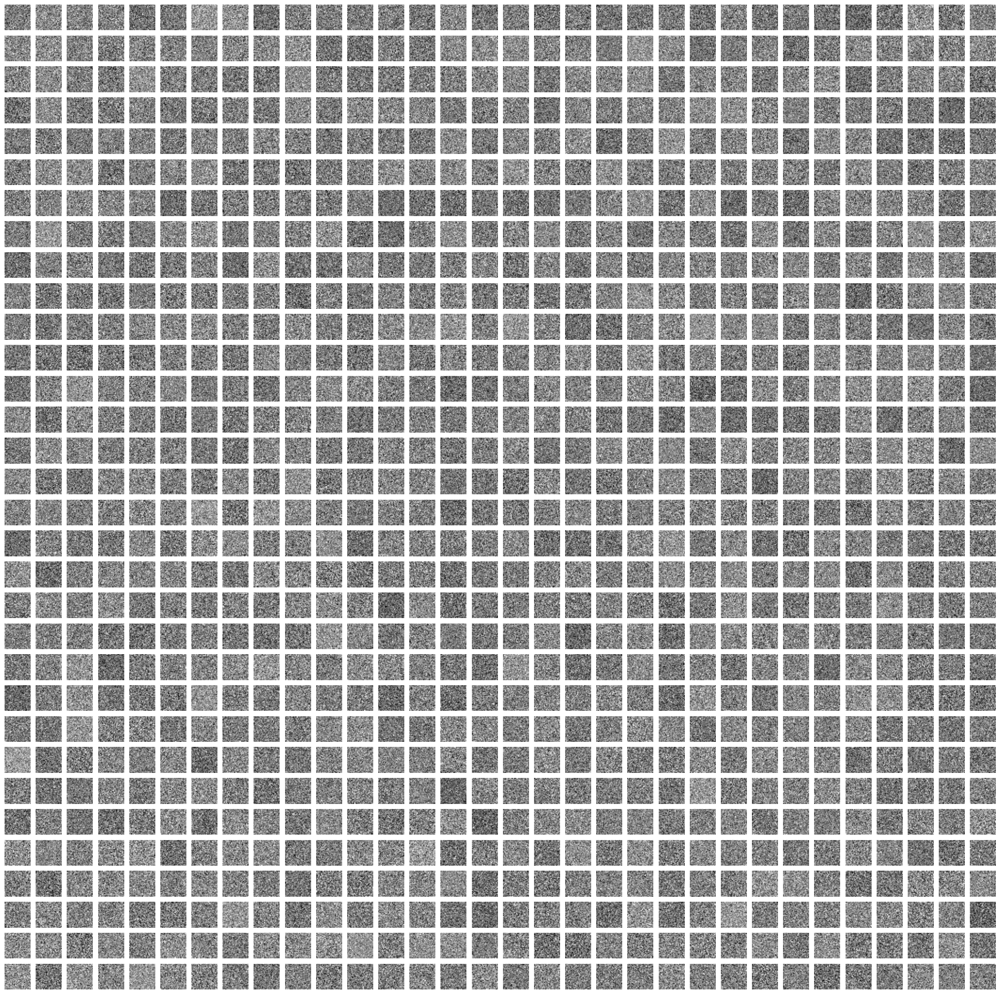

In [ ]:
visualize_layer_weights(only_error_params, 0, 32, 32)

In [ ]:
# Predict
preds = jax.vmap(predict, in_axes=[None, 0])(params, xs)

In [ ]:
train_acc = accuracy(params, (train_images, train_labels))
test_acc = accuracy(params, (test_images, test_labels))
#print("Epoch {} in {:0.2f} sec".format(epoch, epoch_time))
print("Training set accuracy {}".format(train_acc))
print("Test set accuracy {}".format(test_acc))

In [ ]:
jnp.min(params[0][0])

Array(-1.8546276e-11, dtype=float32)